In [1]:
from sklearn.model_selection import train_test_split,RepeatedKFold
from fancyimpute import MICE # imputation
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve,cross_val_score,GridSearchCV
from sklearn.metrics import make_scorer
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

C:\Users\jjonus\Anaconda3\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [2]:
# download data and scrub

url = 'https://github.com/GinoWoz1/AdvancedHousePrices/raw/master/'
 
df_train = pd.read_csv(url + 'train.csv')
df_test = pd.read_csv(url +'test.csv')
df_train.columns.to_series().groupby(df_train.dtypes).groups

# Split data set into test and train
ntrain = df_train.shape[0]
ntest = df_test.shape[0]
y_train = df_train.SalePrice.values
all_data = pd.concat((df_train, df_test)).reset_index(drop=True)
all_data.drop(['SalePrice'], axis=1, inplace=True)


# fill in missing data

all_data['PoolQC'] = all_data['PoolQC'].fillna("None")
all_data["MiscFeature"] = all_data["MiscFeature"].fillna("None")
all_data["Alley"] = all_data["Alley"].fillna("None")
all_data["Fence"] = all_data["Fence"].fillna("None")
all_data["FireplaceQu"] = all_data["FireplaceQu"].fillna("None")

#fill in missing data for garage, basement and mason area

for col in ('GarageType', 'GarageFinish', 'GarageQual', 'GarageCond'):
    all_data[col] = all_data[col].fillna('None')

for col in ( 'GarageArea', 'GarageCars'):
    all_data[col] = all_data[col].fillna(0)
    
for col in ('BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2'):
    all_data[col] = all_data[col].fillna('None')
    
for col in ('BsmtHalfBath', 'BsmtFullBath', 'TotalBsmtSF', 'BsmtUnfSF', 'BsmtFinSF1','BsmtFinSF2'):
    all_data[col] = all_data[col].fillna(0)


all_data["MasVnrType"] = all_data["MasVnrType"].fillna("None")
all_data["MasVnrArea"] = all_data["MasVnrArea"].fillna(0)
all_data["GarageYrBlt"] = all_data.groupby("Neighborhood")["GarageYrBlt"].transform( lambda x: x.fillna(x.mean()))

# fill in MSzoning values based on knowlege of data
    
all_data.loc[2216,'MSZoning'] = 'RM'
all_data.loc[2904,'MSZoning'] = 'RM'
all_data.loc[1915,'MSZoning'] = 'RM'
all_data.loc[2250,'MSZoning'] = 'RM'
all_data.loc[1915,'Utilities'] = 'AllPub'
all_data.loc[1945,'Utilities'] = 'AllPub'
all_data.loc[2473,'Functional'] = 'Typ'
all_data.loc[2216,'Functional'] = 'Typ'
all_data.loc[2489,'SaleType'] = 'WD'
all_data.loc[2151,'Exterior1st'] = 'Plywood'
all_data.loc[2151,'Exterior2nd'] = 'Plywood'
all_data.loc[1379,'Electrical'] = 'SBrkr'

all_data['MSSubClass'] = all_data['MSSubClass'].apply(str)

# analyze which neighborhoods have null data

all_data[pd.isna(all_data['LotFrontage'])].groupby("Neighborhood").size().sort_values(ascending = False)

# evaluation metrics and model vetting function

train = all_data[:ntrain]
test = all_data[ntrain:]
y_train = df_train.SalePrice

numeric_data_train = train.select_dtypes(include = ['float64','int64'])
solver=MICE()
Imputed_dataframe_train= pd.DataFrame(data = solver.complete(numeric_data_train),columns = numeric_data_train.columns,index = numeric_data_train.index)
numeric_data_test = test.select_dtypes(include = ['float64','int64'])
solver=MICE()
Imputed_dataframe_test= pd.DataFrame(data = solver.complete(numeric_data_test),columns = numeric_data_test.columns,index = numeric_data_test.index)

train['LotFrontage'] = Imputed_dataframe_train['LotFrontage']
test['LotFrontage'] = Imputed_dataframe_test['LotFrontage']

X_train= pd.get_dummies(train,drop_first=True)
X_test = pd.get_dummies(test,drop_first=True)

[MICE] Completing matrix with shape (1460, 36)
[MICE] Starting imputation round 1/110, elapsed time 0.000
[MICE] Starting imputation round 2/110, elapsed time 0.456
[MICE] Starting imputation round 3/110, elapsed time 0.456
[MICE] Starting imputation round 4/110, elapsed time 0.456
[MICE] Starting imputation round 5/110, elapsed time 0.456
[MICE] Starting imputation round 6/110, elapsed time 0.456
[MICE] Starting imputation round 7/110, elapsed time 0.456
[MICE] Starting imputation round 8/110, elapsed time 0.456
[MICE] Starting imputation round 9/110, elapsed time 0.456
[MICE] Starting imputation round 10/110, elapsed time 0.456
[MICE] Starting imputation round 11/110, elapsed time 0.456
[MICE] Starting imputation round 12/110, elapsed time 0.472
[MICE] Starting imputation round 13/110, elapsed time 0.472
[MICE] Starting imputation round 14/110, elapsed time 0.472
[MICE] Starting imputation round 15/110, elapsed time 0.472
[MICE] Starting imputation round 16/110, elapsed time 0.472
[M

[MICE] Starting imputation round 86/110, elapsed time 0.078
[MICE] Starting imputation round 87/110, elapsed time 0.078
[MICE] Starting imputation round 88/110, elapsed time 0.078
[MICE] Starting imputation round 89/110, elapsed time 0.082
[MICE] Starting imputation round 90/110, elapsed time 0.083
[MICE] Starting imputation round 91/110, elapsed time 0.084
[MICE] Starting imputation round 92/110, elapsed time 0.085
[MICE] Starting imputation round 93/110, elapsed time 0.086
[MICE] Starting imputation round 94/110, elapsed time 0.087
[MICE] Starting imputation round 95/110, elapsed time 0.087
[MICE] Starting imputation round 96/110, elapsed time 0.088
[MICE] Starting imputation round 97/110, elapsed time 0.089
[MICE] Starting imputation round 98/110, elapsed time 0.090
[MICE] Starting imputation round 99/110, elapsed time 0.091
[MICE] Starting imputation round 100/110, elapsed time 0.092
[MICE] Starting imputation round 101/110, elapsed time 0.093
[MICE] Starting imputation round 102/1

In [3]:
# get dummies, select columns with above 0 mutual information

X_train= pd.get_dummies(train,drop_first=True)
X_test = pd.get_dummies(test,drop_first=True)

X_train = X_train[['OverallQual'	,'GarageCars'	,'TotalBsmtSF'	,'GrLivArea'	,'GarageArea'	,'FullBath'	,'YearBuilt'	,'GarageYrBlt'	,'ExterQual_TA'	,'1stFlrSF'	,'KitchenQual_TA'	,'LotFrontage'	,'ExterQual_Gd'	,'Foundation_PConc'	,'TotRmsAbvGrd'	,'KitchenQual_Gd'	,'YearRemodAdd'	,'BsmtQual_Gd'	,'Fireplaces'	,'BsmtFinSF1'	,'BsmtQual_TA'	,'FireplaceQu_None'	,'GarageFinish_Unf'	,'GarageType_Attchd'	,'BsmtUnfSF'	,'GarageType_Detchd'	,'MSSubClass_60'	,'2ndFlrSF'	,'OverallCond'	,'BsmtFinType1_GLQ'	,'Foundation_CBlock'	,'Exterior1st_VinylSd'	,'LotShape_Reg'	,'MSSubClass_30'	,'HeatingQC_TA'	,'LotArea'	,'MasVnrArea'	,'MasVnrType_None'	,'Neighborhood_NAmes'	,'MSZoning_RM'	,'CentralAir_Y'	,'SaleCondition_Partial'	,'GarageQual_None'	,'HalfBath'	,'GarageFinish_RFn'	,'FireplaceQu_Gd'	,'Neighborhood_NridgHt'	,'GarageQual_TA'	,'HouseStyle_2Story'	,'FireplaceQu_TA'	,'WoodDeckSF'	,'PavedDrive_Y'	,'GarageCond_TA'	,'Neighborhood_NoRidge'	,'MSZoning_RL'	,'SaleType_WD'	,'BedroomAbvGr'	,'Electrical_SBrkr'	,'MasVnrType_Stone'	,'Neighborhood_Somerst'	,'Neighborhood_CollgCr'	,'OpenPorchSF'	,'PoolQC_None'	,'BsmtExposure_Gd'	,'Neighborhood_Gilbert'	,'Street_Pave'	,'Neighborhood_OldTown'	,'KitchenAbvGr'	,'BsmtExposure_No'	,'YrSold'	,'Fence_MnPrv'	,'MSZoning_FV'	,'MasVnrType_BrkFace'	,'Neighborhood_MeadowV'	,'Exterior1st_Wd Sdng'	,'EnclosedPorch'	,'BsmtCond_Gd'	,'Exterior2nd_Wd Sdng'	,'KitchenQual_Fa'	,'BsmtFinType1_Rec'	,'BsmtFinSF2'	,'MSSubClass_160'	,'Exterior1st_CemntBd'	,'Neighborhood_ClearCr'	,'Neighborhood_BrkSide'	,'RoofStyle_Hip'	,'Neighborhood_IDOTRR'	,'GarageType_BuiltIn'	,'MSSubClass_50'	,'Neighborhood_StoneBr'	,'HeatingQC_Gd'	,'Neighborhood_Sawyer'	,'PavedDrive_P'	,'Fence_None'	,'HouseStyle_SFoyer'	,'GarageCond_Fa'	,'SaleCondition_Normal'	,'MSSubClass_45'	,'Functional_Typ'	,'LotConfig_Inside'	,'Exterior1st_MetalSd'	,'Electrical_FuseF'	,'Exterior1st_HdBoard'	,'BsmtQual_Fa'	,'HeatingQC_Fa'	,'Exterior2nd_Plywood'	,'ExterCond_TA'	,'BldgType_Duplex'	,'LotConfig_CulDSac'	,'Alley_None'	,'LotShape_IR2'	,'Neighborhood_Edwards'	,'BsmtFinType2_BLQ'	,'RoofStyle_Gable'	,'GarageCond_Po'	,'Functional_Min2'	,'LandSlope_Mod'	,'ScreenPorch'	,'ExterQual_Fa'	,'Neighborhood_SawyerW'	,'FireplaceQu_Po'	,'LandContour_Lvl'	,'MSSubClass_40'	,'LandContour_HLS'	,'RoofMatl_Tar&Grv'	,'SaleType_ConLw'	,'BsmtExposure_None'	,'Neighborhood_BrDale'	,'RoofStyle_Mansard'	,'MiscVal'	,'BldgType_TwnhsE'	,'Alley_Pave'	,'Exterior1st_WdShing'	,'GarageType_CarPort'	,'Fence_GdWo'	,'Exterior1st_BrkFace'	,'Condition2_Norm'	,'BsmtFinType1_Unf'	,'Heating_Grav'	,'HouseStyle_SLvl'	,'Foundation_Slab'	,'BsmtExposure_Mn'	,'MSSubClass_70'	,'BsmtFinType2_Rec'	,'Condition1_RRAe'	,'Exterior2nd_BrkFace'	,'HouseStyle_1.5Unf'	,'Neighborhood_Mitchel'	,'Electrical_FuseP'	,'Neighborhood_NWAmes'	,'MSSubClass_180'	,'HouseStyle_2.5Unf'	,'RoofStyle_Shed'	,'BsmtFinType2_GLQ'	,'LandSlope_Sev'	,'MSSubClass_85'	,'LotConfig_FR3'	,'LotConfig_FR2'	,'RoofMatl_WdShngl'	,'BsmtHalfBath'	,'Neighborhood_Blueste'	,'Exterior1st_BrkComm'	,'Neighborhood_Timber'	,'Condition1_Norm'	,'Neighborhood_SWISU'	,'BldgType_2fmCon'	,'Neighborhood_Veenker'	,'Condition1_PosA'	,'SaleCondition_Alloca'	,'SaleType_ConLD'	,'3SsnPorch'	,'LotShape_IR3'	,'Condition1_PosN'	,'BsmtFinType1_LwQ'	,'BsmtFinType1_BLQ'	,'MSZoning_RH'	,'Neighborhood_NPkVill'	,'FireplaceQu_Fa']]
X_test = X_test[['OverallQual'	,'GarageCars'	,'TotalBsmtSF'	,'GrLivArea'	,'GarageArea'	,'FullBath'	,'YearBuilt'	,'GarageYrBlt'	,'ExterQual_TA'	,'1stFlrSF'	,'KitchenQual_TA'	,'LotFrontage'	,'ExterQual_Gd'	,'Foundation_PConc'	,'TotRmsAbvGrd'	,'KitchenQual_Gd'	,'YearRemodAdd'	,'BsmtQual_Gd'	,'Fireplaces'	,'BsmtFinSF1'	,'BsmtQual_TA'	,'FireplaceQu_None'	,'GarageFinish_Unf'	,'GarageType_Attchd'	,'BsmtUnfSF'	,'GarageType_Detchd'	,'MSSubClass_60'	,'2ndFlrSF'	,'OverallCond'	,'BsmtFinType1_GLQ'	,'Foundation_CBlock'	,'Exterior1st_VinylSd'	,'LotShape_Reg'	,'MSSubClass_30'	,'HeatingQC_TA'	,'LotArea'	,'MasVnrArea'	,'MasVnrType_None'	,'Neighborhood_NAmes'	,'MSZoning_RM'	,'CentralAir_Y'	,'SaleCondition_Partial'	,'GarageQual_None'	,'HalfBath'	,'GarageFinish_RFn'	,'FireplaceQu_Gd'	,'Neighborhood_NridgHt'	,'GarageQual_TA'	,'HouseStyle_2Story'	,'FireplaceQu_TA'	,'WoodDeckSF'	,'PavedDrive_Y'	,'GarageCond_TA'	,'Neighborhood_NoRidge'	,'MSZoning_RL'	,'SaleType_WD'	,'BedroomAbvGr'	,'Electrical_SBrkr'	,'MasVnrType_Stone'	,'Neighborhood_Somerst'	,'Neighborhood_CollgCr'	,'OpenPorchSF'	,'PoolQC_None'	,'BsmtExposure_Gd'	,'Neighborhood_Gilbert'	,'Street_Pave'	,'Neighborhood_OldTown'	,'KitchenAbvGr'	,'BsmtExposure_No'	,'YrSold'	,'Fence_MnPrv'	,'MSZoning_FV'	,'MasVnrType_BrkFace'	,'Neighborhood_MeadowV'	,'Exterior1st_Wd Sdng'	,'EnclosedPorch'	,'BsmtCond_Gd'	,'Exterior2nd_Wd Sdng'	,'KitchenQual_Fa'	,'BsmtFinType1_Rec'	,'BsmtFinSF2'	,'MSSubClass_160'	,'Exterior1st_CemntBd'	,'Neighborhood_ClearCr'	,'Neighborhood_BrkSide'	,'RoofStyle_Hip'	,'Neighborhood_IDOTRR'	,'GarageType_BuiltIn'	,'MSSubClass_50'	,'Neighborhood_StoneBr'	,'HeatingQC_Gd'	,'Neighborhood_Sawyer'	,'PavedDrive_P'	,'Fence_None'	,'HouseStyle_SFoyer'	,'GarageCond_Fa'	,'SaleCondition_Normal'	,'MSSubClass_45'	,'Functional_Typ'	,'LotConfig_Inside'	,'Exterior1st_MetalSd'	,'Electrical_FuseF'	,'Exterior1st_HdBoard'	,'BsmtQual_Fa'	,'HeatingQC_Fa'	,'Exterior2nd_Plywood'	,'ExterCond_TA'	,'BldgType_Duplex'	,'LotConfig_CulDSac'	,'Alley_None'	,'LotShape_IR2'	,'Neighborhood_Edwards'	,'BsmtFinType2_BLQ'	,'RoofStyle_Gable'	,'GarageCond_Po'	,'Functional_Min2'	,'LandSlope_Mod'	,'ScreenPorch'	,'ExterQual_Fa'	,'Neighborhood_SawyerW'	,'FireplaceQu_Po'	,'LandContour_Lvl'	,'MSSubClass_40'	,'LandContour_HLS'	,'RoofMatl_Tar&Grv'	,'SaleType_ConLw'	,'BsmtExposure_None'	,'Neighborhood_BrDale'	,'RoofStyle_Mansard'	,'MiscVal'	,'BldgType_TwnhsE'	,'Alley_Pave'	,'Exterior1st_WdShing'	,'GarageType_CarPort'	,'Fence_GdWo'	,'Exterior1st_BrkFace'	,'Condition2_Norm'	,'BsmtFinType1_Unf'	,'Heating_Grav'	,'HouseStyle_SLvl'	,'Foundation_Slab'	,'BsmtExposure_Mn'	,'MSSubClass_70'	,'BsmtFinType2_Rec'	,'Condition1_RRAe'	,'Exterior2nd_BrkFace'	,'HouseStyle_1.5Unf'	,'Neighborhood_Mitchel'	,'Electrical_FuseP'	,'Neighborhood_NWAmes'	,'MSSubClass_180'	,'HouseStyle_2.5Unf'	,'RoofStyle_Shed'	,'BsmtFinType2_GLQ'	,'LandSlope_Sev'	,'MSSubClass_85'	,'LotConfig_FR3'	,'LotConfig_FR2'	,'RoofMatl_WdShngl'	,'BsmtHalfBath'	,'Neighborhood_Blueste'	,'Exterior1st_BrkComm'	,'Neighborhood_Timber'	,'Condition1_Norm'	,'Neighborhood_SWISU'	,'BldgType_2fmCon'	,'Neighborhood_Veenker'	,'Condition1_PosA'	,'SaleCondition_Alloca'	,'SaleType_ConLD'	,'3SsnPorch'	,'LotShape_IR3'	,'Condition1_PosN'	,'BsmtFinType1_LwQ'	,'BsmtFinType1_BLQ'	,'MSZoning_RH'	,'Neighborhood_NPkVill'	,'FireplaceQu_Fa']]

remove = ['BsmtQual_None','Exterior2nd_MetalSd','BsmtFinType1_None','MSSubClass_90','BsmtCond_None','BsmtEpoxsure_None','BsmtFinType2_None','GarageFinish_None','GarageCond_None','GarageType_None','MSSubClass_190','MSSubClass_80','Exterior2nd_CmentBd','SaleType_New','Exterior2nd_VinylSd']

def drop_cols(dataframe,columns_remove):
    cols =list(dataframe.columns.values)
    for col in columns_remove:
        for c in cols:
            if c == col:
                cols.remove(c)
            elif c != col:
                continue
    dataframe = dataframe[cols]
    return dataframe


X_train = drop_cols(X_train,remove)
X_test = drop_cols(X_test,remove)

# set scoring functions

def rmsle(y_true, y_pred): 
    assert len(y_true) == len(y_pred)
    return np.sqrt(np.mean((np.log(1+y_pred) - np.log(1+y_true))**2))


def rmsle_cv(y_true, y_pred) : 
    assert len(y_true) == len(y_pred)
    if not (y_true >= 0).all() and not (y_pred >= 0).all():
        raise ValueError("Mean Squared Logarithmic Error cannot be used when "
                         "targets contain negative values.")
    return np.sqrt(np.mean((np.log(1+y_pred) - np.log(1+y_true))**2))

rmsle_cv = make_scorer(rmsle_cv,greater_is_better=False)   

In [20]:
def TrainRegress(model,scorer,sigma,param_grid=[], X=[], y=[], splits=5, repeats=5):
    # create cross-validation method
    rkfold = RepeatedKFold(n_splits=splits, n_repeats=repeats)
    
    # perform a grid search if param_grid given
    if len(param_grid)>0:
        # setup grid search parameters
        gsearch = GridSearchCV(model, param_grid, cv=rkfold,
                               scoring=scorer,
                               verbose=1, return_train_score=True)

        # search the grid
        gsearch.fit(X,y)

        # extract best model from the grid
        model = gsearch.best_estimator_        
        best_idx = gsearch.best_index_

        # get cv-scores for best model
        grid_results = pd.DataFrame(gsearch.cv_results_)       
        cv_mean = abs(grid_results.loc[best_idx,'mean_test_score'])
        cv_std = grid_results.loc[best_idx,'std_test_score']

    # no grid search, just cross-val score for given model    
    else:
        grid_results = []
        cv_results = cross_val_score(model, X, y, scoring=scorer, cv=rkfold)
        cv_mean = abs(np.mean(cv_results))
        cv_std = np.std(cv_results)
    
    # combine mean and std cv-score in to a pandas series
    cv_score = pd.Series({'mean':cv_mean,'std':cv_std})

    # predict y using the fitted model
    y_pred = model.predict(X)
    
    
    # print stats on model performance         
    print('----------------------')
    print(model)
    print('----------------------')
    print('cross_val: mean=',cv_mean,', std=',cv_std)

    # residual plots
    y_pred = pd.Series(y_pred,index=y.index)
    resid = y - y_pred
    mean_resid = resid.mean()
    std_resid = resid.std()
    z = (resid - mean_resid)/std_resid    
    n_outliers = sum(abs(z)>sigma)
    outliers = z[abs(z)>sigma].index
    print(len(outliers),'outliers:')
    print(outliers.tolist())
        
    
    plt.figure(figsize=(15,15))
    ax_131 = plt.subplot(221)
    plt.plot(y,y_pred,'.')
    plt.ylim(top= 550000)
    plt.ylim(bottom=0)
    plt.xlim(xmax= 550000)
    plt.xlim(xmin=0)
    ax_131.plot([0, 1], [0, 1], transform=ax_131.transAxes)
    plt.xlabel('y')
    plt.ylabel('y_pred');
    plt.title('corr = {:.3f}'.format(np.corrcoef(y,y_pred)[0][1]))
    ax_132=plt.subplot(222)
    plt.plot(y,y-y_pred,'.')
    plt.ylim(bottom=-75000)
    plt.ylim(top=75000)
    plt.xlabel('y')
    plt.ylabel('y - y_pred');
    plt.title('std resid = {:.3f}'.format(std_resid))
    
    ax_133=plt.subplot(223)
    z.plot.hist(bins=50,ax=ax_133)
    plt.xlabel('z')
    plt.xlim(xmax = 10)
    plt.xlim(xmin=-10)
    plt.title('{:.0f} samples with z>3'.format(n_outliers))
    df_outliers = X.copy()
    df_outliers['Target'] = y
    df_outliers['Prediction'] = y_pred
    df_outliers['Residual'] = resid
    df_outliers['Outlier'] = 0
    for index in outliers.tolist():
        df_outliers.loc[index,'Outlier'] = 1
    ax_211 = plt.subplot(224)
    train_sizes,train_scores,test_scores = learning_curve(estimator=model,X=X,y=y,train_sizes=np.linspace(0.1,1.0,10),cv=rkfold,n_jobs=1)
    train_mean = np.mean(train_scores,axis=1)
    train_std = np.std(train_scores,axis=1)
    test_mean = np.mean(test_scores,axis=1)
    test_std = np.std(test_scores,axis=1)
    plt.plot(train_sizes,train_mean,color = 'blue',marker='o',markersize=5,label='training accuracy')
    plt.fill_between(train_sizes,train_mean + train_std,train_mean - train_std,alpha=0.15,color='blue')
    plt.plot(train_sizes,test_mean,color='green',linestyle='--',marker='s',markersize=5,label='validation accuracy')
    plt.fill_between(train_sizes,test_mean + test_std,test_mean - test_std,alpha=0.15,color='blue')
    plt.grid()
    plt.xlabel('Number of training samples')
    plt.ylabel('Accuracy')
    plt.legend(loc='lower right')
    plt.ylim([0.5,1.1])
    plt.show()
    
    return model, cv_score, grid_results,df_outliers

In [5]:
# define train and predict functions

def fit_train(m,X_train,y_train,model,score_frame):
    m.fit(X_train,y_train)
    opt_models[model],cv_score,grid_results,df_outliers = TrainRegress(m,sigma=3,scorer = rmsle_cv, X = X_train,y=y_train,splits=10)   
    cv_score.name = model
    score_frame = score_frame.append(cv_score)
    return score_frame,m


C:\Users\jjonus\Anaconda3\lib\site-packages\deap\tools\_hypervolume\pyhv.py:33: ImportWarning: Falling back to the python version of hypervolume module. Expect this to be very slow.
  "module. Expect this to be very slow.", ImportWarning)
C:\Users\jjonus\Anaconda3\lib\importlib\_bootstrap.py:219: ImportWarning: can't resolve package from __spec__ or __package__, falling back on __name__ and __path__
  return f(*args, **kwds)


----------------------
Pipeline(memory=None,
     steps=[('stackingestimator-1', StackingEstimator(estimator=RidgeCV(alphas=array([ 0.1,  1. , 10. ]), cv=None, fit_intercept=True,
    gcv_mode=None, normalize=False, scoring=None, store_cv_values=False))), ('stackingestimator-2', StackingEstimator(estimator=GradientBoostingRegressor(alpha=0.95, crit...      reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=True, subsample=1.0))])
----------------------
cross_val: mean= 0.12491616723772767 , std= 0.02181711373647404
17 outliers:
[13, 30, 181, 218, 318, 377, 462, 559, 560, 632, 658, 681, 688, 970, 990, 1324, 1453]


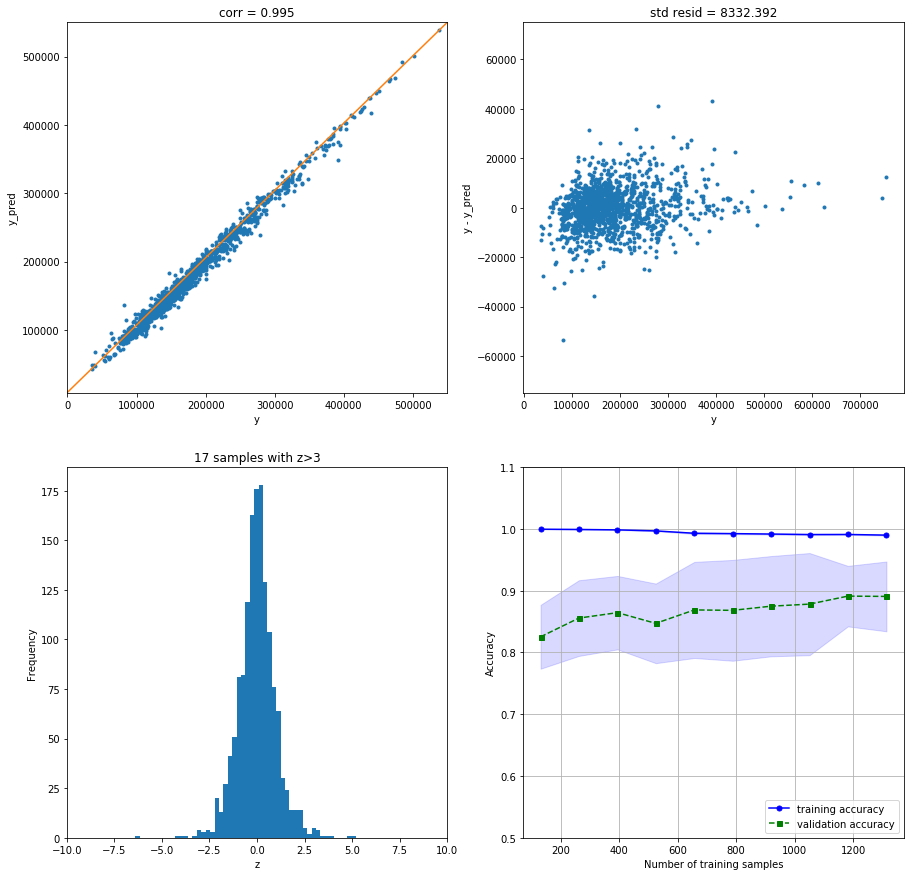

In [6]:
# interpret the model below using shap - first look at residuals for the whole model


# models being used

# 1 Ridge - to build the distribution
# 2 GB - error correction on the distribution with interactions of other terms
# 3 XGB - error correction on the first and second distribution with smaller interactions of the other terms

from sklearn.pipeline import make_pipeline
from sklearn.linear_model import RidgeCV,LassoCV
from xgboost import XGBRegressor
from tpot.builtins import StackingEstimator
from sklearn.ensemble import GradientBoostingRegressor

opt_models = dict()
score_models = pd.DataFrame(columns=['mean','std'])

exported_pipeline = make_pipeline(
    StackingEstimator(estimator=RidgeCV()), 
    StackingEstimator(estimator=
                      GradientBoostingRegressor(alpha=0.95, learning_rate=0.1, 
                      loss="lad", max_depth=3, max_features=0.2, min_samples_leaf=19,
                      min_samples_split=15, n_estimators=100, subsample=0.6500000000000001)),
    XGBRegressor(learning_rate=0.1, max_depth=5, min_child_weight=2, n_estimators=100, nthread=8, subsample=1.0)
)

score_models,model = fit_train(exported_pipeline,X_train,y_train,'Ridge_GB_XGB_2',score_models)


----------------------
RidgeCV(alphas=array([ 0.1,  1. , 10. ]), cv=None, fit_intercept=True,
    gcv_mode=None, normalize=False, scoring=None, store_cv_values=False)
----------------------
cross_val: mean= 0.150647772753819 , std= 0.021107819672917288
20 outliers:
[178, 185, 377, 440, 473, 523, 581, 588, 632, 688, 691, 774, 803, 898, 1046, 1169, 1181, 1182, 1298, 1324]


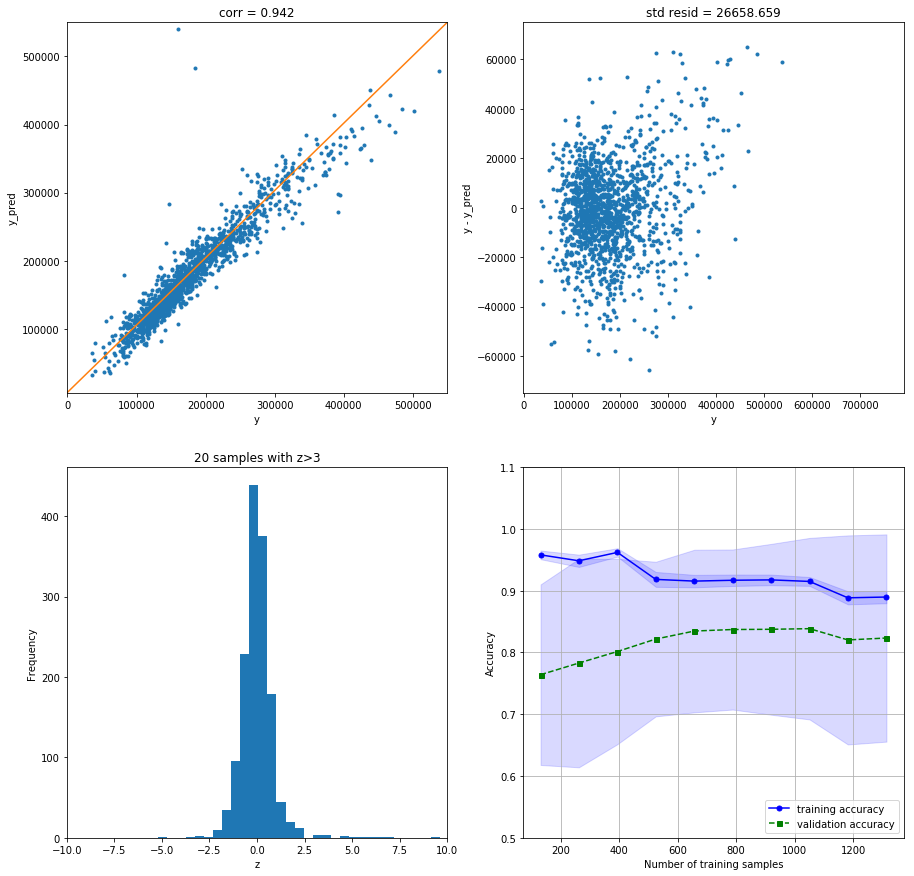

In [7]:
# first stacked layer - building the distribution

ridge = RidgeCV()
score_models,model = fit_train(ridge,X_train,y_train,'Ridge',score_models)


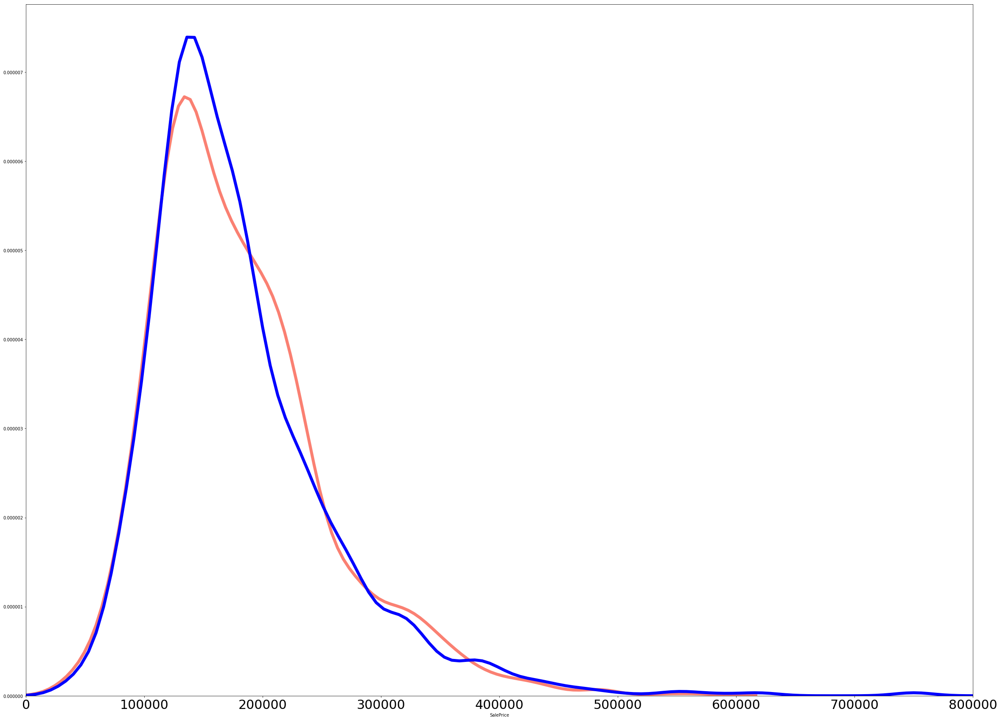

In [130]:
ridge_pred = ridge.predict(X_train)
plt.figure(figsize=(40,30))
plt.xlim(left=0)
plt.xlim(right=800000)
plt.xticks(fontsize=30)
sns.distplot(ridge_pred,color="salmon",hist=False,kde_kws=dict( linewidth= 7))
plt.xlim(left=0)
plt.xlim(right=800000)
sns.distplot(y_train,color="blue",hist=False,kde_kws=dict( linewidth= 7))

# blue distribution is the y_train
# salmon is the ridge prediction - almost identical distribution with a little more uneveness - not so normal
# look at the right side of the skewed distributions



In [9]:
import shap

# initiate shap for explanation of the model
# shap does a local explanation 
# trains model with all variables and then drops the variables to test the importances
# shap values in the output
# does this over 1000s of samples on the same model to modulate the variance on explanation

explainer = shap.LinearExplainer(model,X_train)
shap_values = explainer.shap_values(X_train)

C:\Users\jjonus\Anaconda3\lib\importlib\_bootstrap.py:219: ImportWarning: can't resolve package from __spec__ or __package__, falling back on __name__ and __path__
  return f(*args, **kwds)


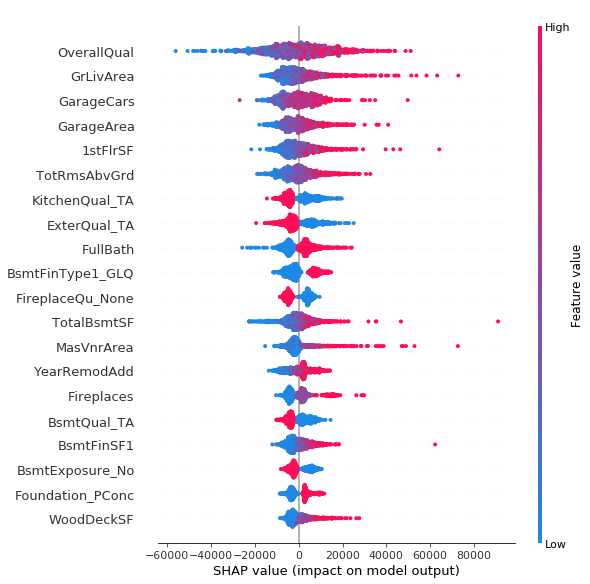

In [15]:
# the yellow distribution above has been built based on the values below
# red values signify high impact, blue value low impact relative to the area that it is predicting in

shap.initjs()
shap.summary_plot(shap_values,X_train)

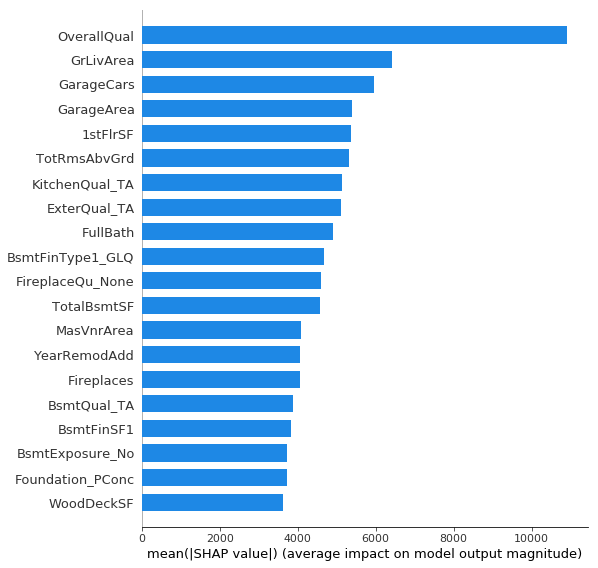

In [11]:
# ridge predictions importances ordered

shap.summary_plot(shap_values,X_train,plot_type="bar")

In [18]:
# take predicted vector and add in to the raw data for the 2nd prediction
ridge_pred = pd.DataFrame(ridge_pred)
X_train_comb = pd.concat([X_train,ridge_pred],axis=1)
X_train_comb.rename(columns = {0:'Ridge_prediction'},inplace=True)
X_train_comb.head(5)

,OverallQual,GarageCars,TotalBsmtSF,GrLivArea,GarageArea,FullBath,YearBuilt,GarageYrBlt,ExterQual_TA,1stFlrSF,...,SaleType_ConLD,3SsnPorch,LotShape_IR3,Condition1_PosN,BsmtFinType1_LwQ,BsmtFinType1_BLQ,MSZoning_RH,Neighborhood_NPkVill,FireplaceQu_Fa,Ridge_prediction
0,7,2.0,856.0,1710,548.0,2,2003,2003.0,0,856,...,0,0,0,0,0,0,0,0,0,205225.228639
1,6,2.0,1262.0,1262,460.0,2,1976,1976.0,1,1262,...,0,0,0,0,0,0,0,0,0,198180.084926
2,7,2.0,920.0,1786,608.0,2,2001,2001.0,0,920,...,0,0,0,0,0,0,0,0,0,209852.101200
3,7,3.0,756.0,1717,642.0,1,1915,1998.0,1,961,...,0,0,0,0,0,0,0,0,0,178961.368496
4,8,3.0,1145.0,2198,836.0,2,2000,2000.0,0,1145,...,0,0,0,0,0,0,0,0,0,299031.745513


----------------------
GradientBoostingRegressor(alpha=0.95, criterion='friedman_mse', init=None,
             learning_rate=0.1, loss='lad', max_depth=3, max_features=0.2,
             max_leaf_nodes=None, min_impurity_decrease=0.0,
             min_impurity_split=None, min_samples_leaf=19,
             min_samples_split=15, min_weight_fraction_leaf=0.0,
             n_estimators=100, n_iter_no_change=None, presort='auto',
             random_state=None, subsample=0.6500000000000001, tol=0.0001,
             validation_fraction=0.1, verbose=0, warm_start=False)
----------------------
cross_val: mean= 0.12498778221777669 , std= 0.019849555319891497
18 outliers:
[185, 313, 440, 523, 581, 608, 632, 688, 691, 769, 803, 898, 1046, 1169, 1181, 1182, 1298, 1324]


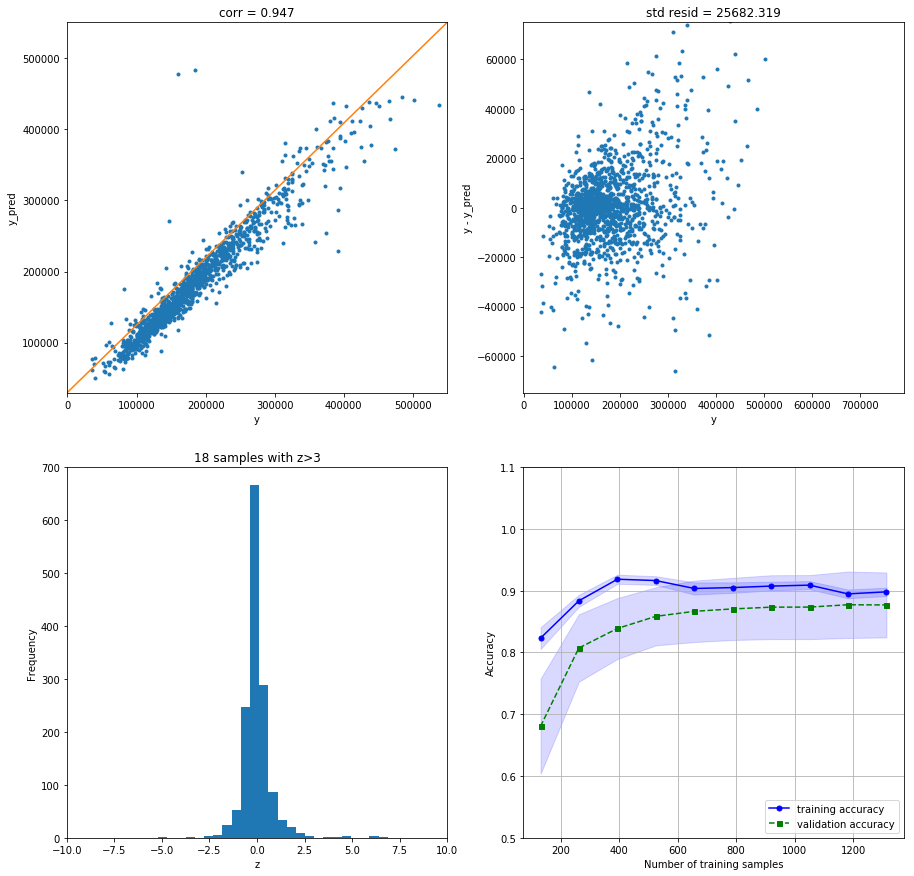

In [19]:
# initiate the 2nd layer, taking the ridge output + raw data
# as you see, it does some error correction on the distribution

gb = GradientBoostingRegressor(alpha=0.95, learning_rate=0.1, loss="lad", max_depth=3, max_features=0.2, min_samples_leaf=19, min_samples_split=15, n_estimators=100, subsample=0.6500000000000001)

score_models,model = fit_train(gb,X_train_comb,y_train,'gb + predictions',score_models)


In [26]:
# explain the gb + ridge model
def gb_predict(data_asarray):
    data_asframe =  pd.DataFrame(data_asarray, columns=X_train_comb.columns.tolist())
    return model.predict(data_asframe)

shap_kernel_explainer = shap.KernelExplainer(gb_predict, X_train_comb)
shap_values = shap_kernel_explainer.shap_values(X_train_comb,nsamples=1000)

Using 1460 background data samples could cause slower run times. Consider using shap.kmeans(data, K) to summarize the background as K weighted samples.

  7%|██▌                                   | 99/1460 [24:30<5:30:38, 14.58s/it]


 14%|█████                                | 201/1460 [48:50<4:56:34, 14.13s/it]


 21%|███████▎                           | 303/1460 [1:13:03<4:37:00, 14.37s/it]


 28%|█████████▋                         | 405/1460 [1:37:18<4:11:46, 14.32s/it]


 35%|████████████▏                      | 507/1460 [2:01:31<3:45:18, 14.19s/it]


 42%|██████████████▌                    | 609/1460 [2:25:52<3:23:48, 14.37s/it]


 49%|█████████████████                  | 711/1460 [2:50:27<2:57:36, 14.23s/it]


 56%|███████████████████▍               | 813/1460 [3:14:37<2:34:07, 14.29s/it]


 63%|█████████████████████▉             | 915/1460 [3:38:58<2:09:10, 14.22s/it]


 70%|███████████████████████▋          | 1017/1460 [4:03:24<1:46:34, 14.43s/it]


 77%|██████████████████████████        | 1119/1460 [4:27:49<1:21:31, 14.34s/it]


 84%|████████████████████████████▍     | 1221/1460 [4:52:45<1:02:18, 15.64s/it]


 91%|████████████████████████████████▌   | 1323/1460 [5:18:12<34:23, 15.06s/it]


 98%|███████████████████████████████████▏| 1425/1460 [5:43:15<08:26, 14.48s/it]


100%|████████████████████████████████████| 1460/1460 [5:51:54<00:00, 15.00s/it]


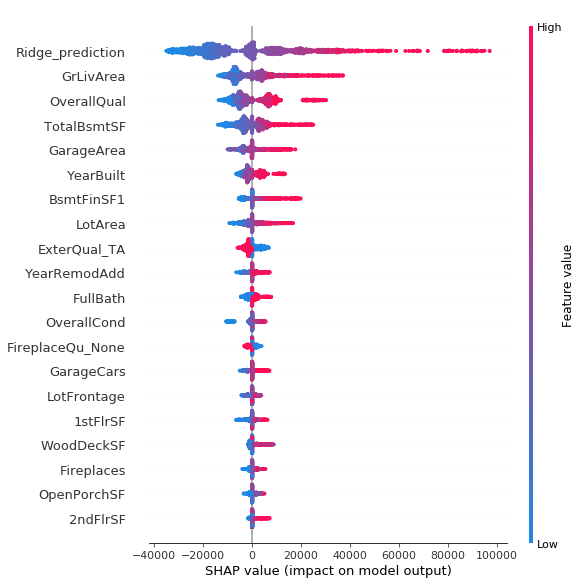

In [28]:
# highest important value is now the ridge prediction
# other terms still interact 
shap.summary_plot(shap_values,X_train_comb)

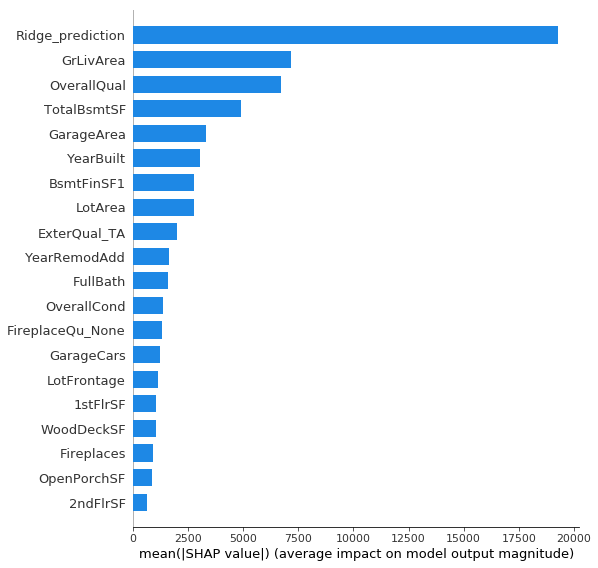

In [29]:
# bar plot on importances
shap.summary_plot(shap_values,X_train_comb,plot_type="bar")

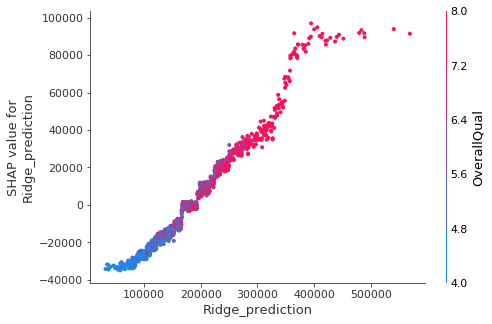

In [56]:
# look at dependence between the ridge prediction, the shap values and overall quality
# overall quality has higher impact on the upper ends of hte prediction - still some interactions  at the lower end

shap.dependence_plot('Ridge_prediction',shap_values=shap_values,features=X_train_comb,interaction_index=0)

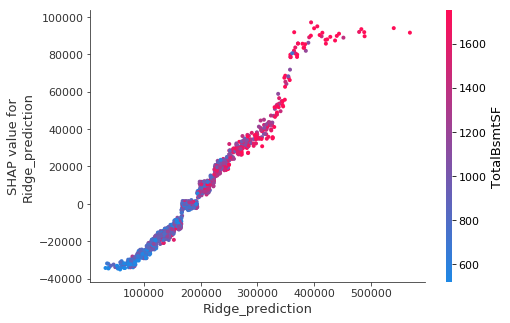

In [41]:
# Total Bsmt SF - interacts on lower end and scattered throughout - less interaction effect at higher end than overall quality

shap.dependence_plot('Ridge_prediction',shap_values=shap_values,features=X_train_comb,interaction_index=2)

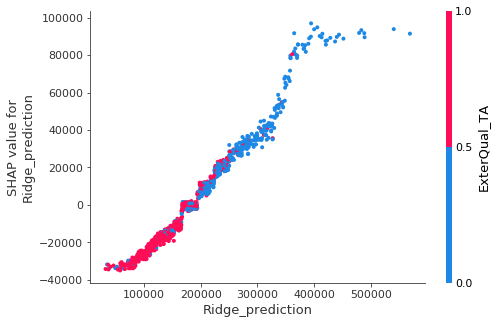

In [43]:
# Low Qual External quality
# bigger impact at lower end of predictions

shap.dependence_plot('Ridge_prediction',shap_values=shap_values,features=X_train_comb,interaction_index=8)

In [44]:
# combine ridge prediction + gb correction term

gb_pred = model.predict(X_train_comb)
gb_pred = pd.DataFrame(gb_pred)
X_train_comb2 = pd.concat([X_train_comb,gb_pred],axis=1)
X_train_comb2.rename(columns = {0:'GB generalizer'},inplace=True)
X_train_comb2.head(5)

,OverallQual,GarageCars,TotalBsmtSF,GrLivArea,GarageArea,FullBath,YearBuilt,GarageYrBlt,ExterQual_TA,1stFlrSF,...,3SsnPorch,LotShape_IR3,Condition1_PosN,BsmtFinType1_LwQ,BsmtFinType1_BLQ,MSZoning_RH,Neighborhood_NPkVill,FireplaceQu_Fa,Ridge_prediction,GB generalizer
0,7,2.0,856.0,1710,548.0,2,2003,2003.0,0,856,...,0,0,0,0,0,0,0,0,205225.228639,209188.837435
1,6,2.0,1262.0,1262,460.0,2,1976,1976.0,1,1262,...,0,0,0,0,0,0,0,0,198180.084926,183997.851050
2,7,2.0,920.0,1786,608.0,2,2001,2001.0,0,920,...,0,0,0,0,0,0,0,0,209852.101200,216891.724300
3,7,3.0,756.0,1717,642.0,1,1915,1998.0,1,961,...,0,0,0,0,0,0,0,0,178961.368496,164196.424319
4,8,3.0,1145.0,2198,836.0,2,2000,2000.0,0,1145,...,0,0,0,0,0,0,0,0,299031.745513,294045.350024


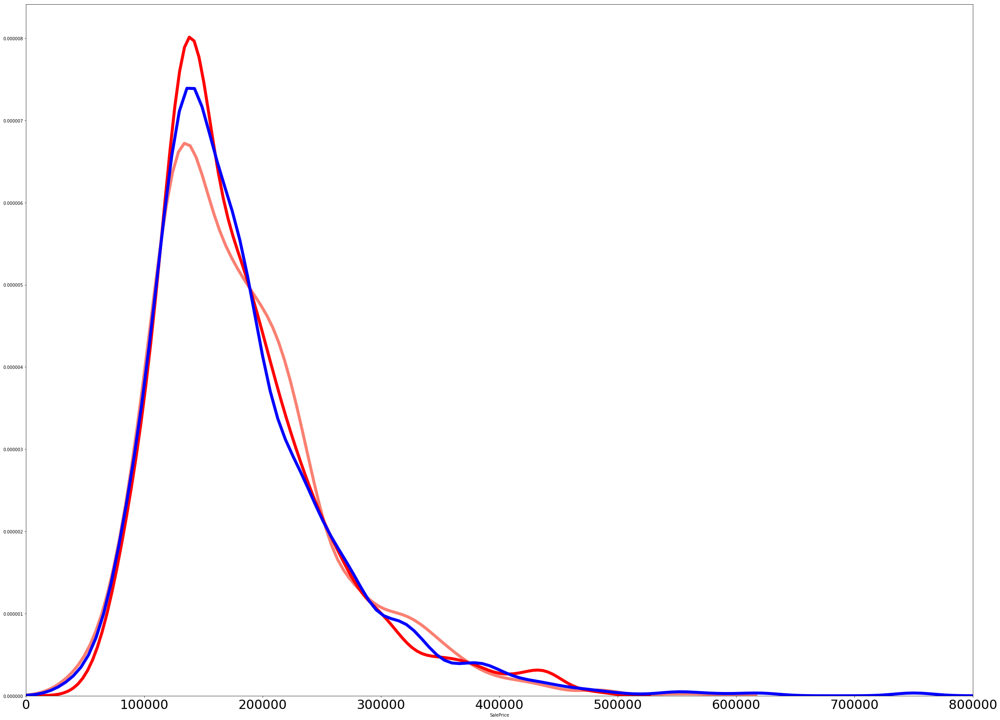

In [129]:
# plot out distributions

plt.figure(figsize=(40,30))
plt.xlim(left=0)
plt.xlim(right=800000)
plt.xticks(fontsize=30)
sns.distplot(ridge_pred,color="salmon",hist=False,  kde_kws=dict( linewidth= 7))
sns.distplot(gb_pred,color="red",hist=False, kde_kws=dict( linewidth= 7))
plt.xlim(left=0)
plt.xlim(right=800000)
sns.distplot(y_train,color="blue",hist=False, kde_kws=dict( linewidth= 7))

# blue distribution is the y_train
# yellow is the ridge prediction - almost identical distribution with a little more uneveness - not so normal
# red distribution has corrected that uneveness - nature of the GB model
# look at the right side of the skewed distributions
# yellow pokes out but then GB corrects the distribution back in

----------------------
XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=1, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=5, min_child_weight=2, missing=None, n_estimators=100,
       n_jobs=1, nthread=8, objective='reg:linear', random_state=0,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=True, subsample=1.0)
----------------------
cross_val: mean= 0.11142695290675234 , std= 0.014473085579264145
15 outliers:
[4, 13, 139, 377, 462, 559, 632, 681, 688, 707, 774, 970, 1075, 1324, 1453]


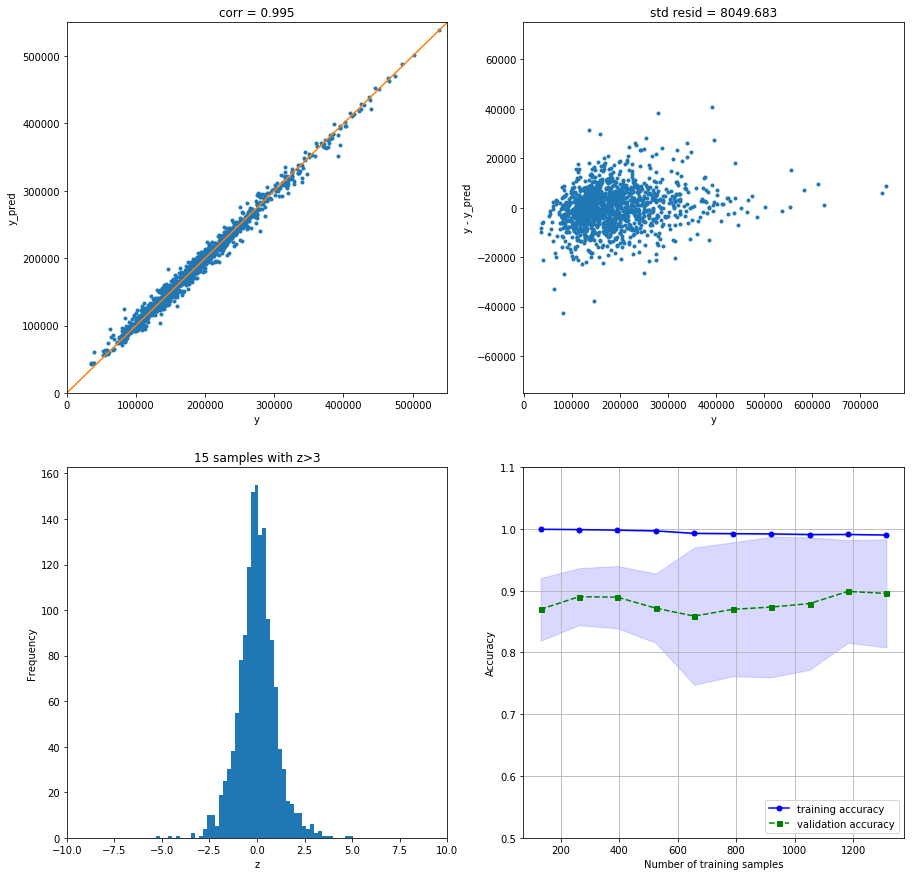

In [45]:
# run the XGB model with ridge and GB predictions
# best fitting model, residuals look tight

xgb = XGBRegressor(learning_rate=0.1, max_depth=5, min_child_weight=2, n_estimators=100, nthread=8, subsample=1.0)
score_models,model = fit_train(xgb,X_train_comb2,y_train,'xgb 2nd prediction',score_models)


In [59]:
def xgb_predict(data_asarray):
    data_asframe =  pd.DataFrame(data_asarray, columns=X_train_comb2.columns.tolist())
    return model.predict(data_asframe)

shap_kernel_explainer = shap.KernelExplainer(xgb_predict, X_train_comb2)
shap_values = shap_kernel_explainer.shap_values(X_train_comb2,nsamples=1000)

Using 1460 background data samples could cause slower run times. Consider using shap.kmeans(data, K) to summarize the background as K weighted samples.

  7%|██▌                                   | 99/1460 [28:38<6:31:06, 17.24s/it]


 14%|█████                                | 201/1460 [57:50<5:54:41, 16.90s/it]


 21%|███████▎                           | 303/1460 [1:26:32<5:25:17, 16.87s/it]


 28%|█████████▋                         | 405/1460 [1:56:39<5:43:16, 19.52s/it]


 35%|████████████▏                      | 507/1460 [2:30:58<5:17:50, 20.01s/it]


 42%|██████████████▌                    | 609/1460 [3:00:51<3:59:16, 16.87s/it]


 49%|█████████████████                  | 711/1460 [3:29:36<3:31:40, 16.96s/it]


 56%|███████████████████▍               | 813/1460 [3:58:20<3:02:43, 16.94s/it]


 63%|█████████████████████▉             | 915/1460 [4:27:02<2:31:54, 16.72s/it]


 70%|███████████████████████▋          | 1017/1460 [4:55:38<2:05:14, 16.96s/it]


 77%|██████████████████████████        | 1119/1460 [5:24:14<1:35:55, 16.88s/it]


 84%|████████████████████████████▍     | 1221/1460 [5:53:08<1:10:55, 17.80s/it]


 91%|████████████████████████████████▌   | 1323/1460 [6:22:21<38:33, 16.89s/it]


 98%|███████████████████████████████████▏| 1425/1460 [6:51:06<09:49, 16.83s/it]


100%|████████████████████████████████████| 1460/1460 [7:01:00<00:00, 17.07s/it]


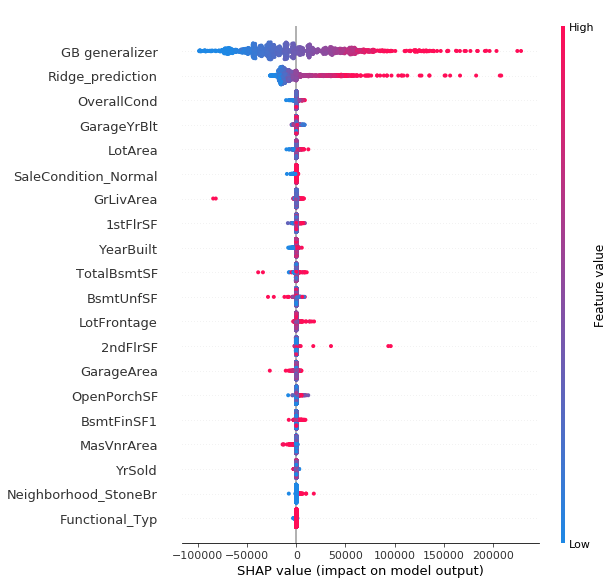

In [60]:
shap.summary_plot(shap_values,X_train_comb2)

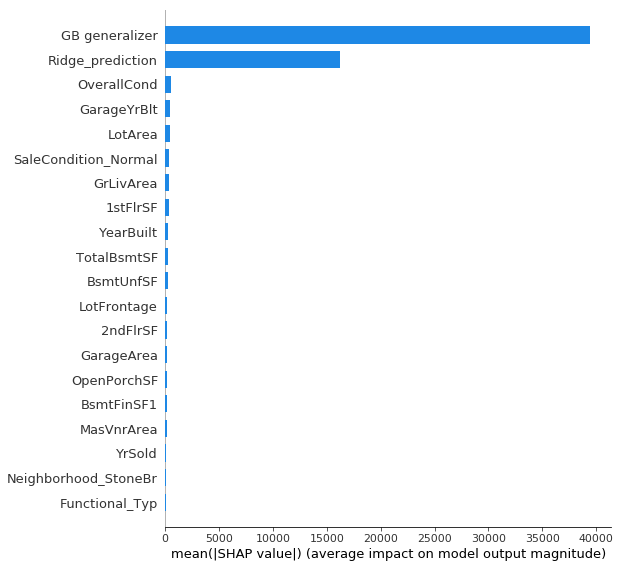

In [65]:
shap.summary_plot(shap_values,X_train_comb2,plot_type="bar")

In [66]:
shap.force_plot(explainer.expected_value,shap_values,X_train_comb2)

In [70]:
shap.force_plot(explainer.expected_value,shap_values[1182],X_train_comb2.iloc[1182,:])

In [71]:
shap.force_plot(explainer.expected_value,shap_values[29],X_train_comb2.iloc[29,:])

In [74]:
shap.force_plot(explainer.expected_value,shap_values[1298],X_train_comb2.iloc[1298,:])

In [75]:
shap.force_plot(explainer.expected_value,shap_values[961],X_train_comb2.iloc[961,:])

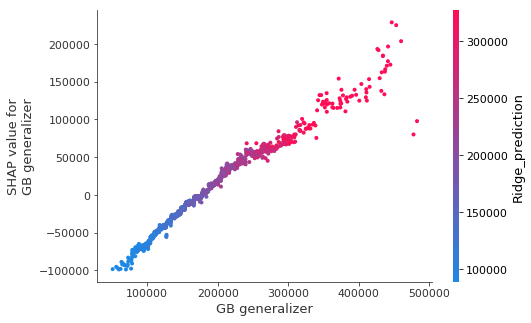

In [64]:
shap.dependence_plot('GB generalizer',shap_values=shap_values,features=X_train_comb2,interaction_index=178)

In [96]:
xgb_pred = model.predict(X_train_comb2)
xgb_pred = pd.DataFrame(xgb_pred)
X_train_comb3 = pd.concat([X_train_comb2,xgb_pred],axis=1)
X_train_comb3.rename(columns = {0:'XGB generalizer'},inplace=True)
X_train_comb3.head(5)

,OverallQual,GarageCars,TotalBsmtSF,GrLivArea,GarageArea,FullBath,YearBuilt,GarageYrBlt,ExterQual_TA,1stFlrSF,...,LotShape_IR3,Condition1_PosN,BsmtFinType1_LwQ,BsmtFinType1_BLQ,MSZoning_RH,Neighborhood_NPkVill,FireplaceQu_Fa,Ridge_prediction,GB generalizer,XGB generalizer
0,7,2.0,856.0,1710,548.0,2,2003,2003.0,0,856,...,0,0,0,0,0,0,0,205225.228639,209188.837435,210003.921875
1,6,2.0,1262.0,1262,460.0,2,1976,1976.0,1,1262,...,0,0,0,0,0,0,0,198180.084926,183997.851050,183636.109375
2,7,2.0,920.0,1786,608.0,2,2001,2001.0,0,920,...,0,0,0,0,0,0,0,209852.101200,216891.724300,217406.859375
3,7,3.0,756.0,1717,642.0,1,1915,1998.0,1,961,...,0,0,0,0,0,0,0,178961.368496,164196.424319,145709.546875
4,8,3.0,1145.0,2198,836.0,2,2000,2000.0,0,1145,...,0,0,0,0,0,0,0,299031.745513,294045.350024,276390.812500


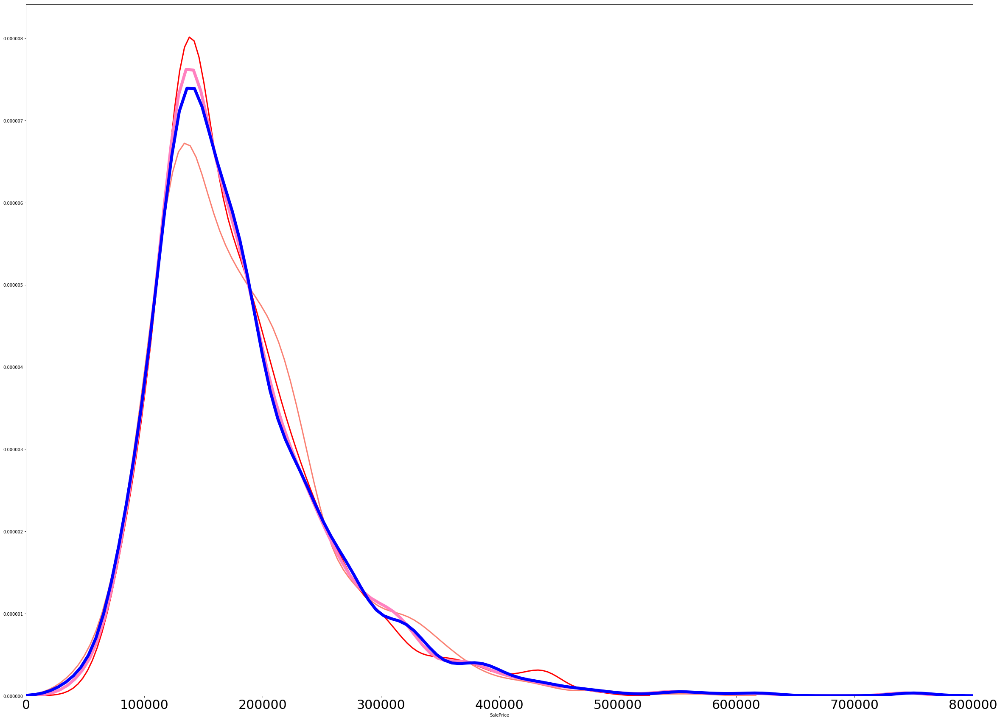

In [104]:
plt.figure(figsize=(40,30))
plt.xlim(left=0)
plt.xlim(right=800000)
plt.xticks(fontsize=30)
sns.distplot(ridge_pred,color="salmon",hist=False,  kde_kws=dict( linewidth= 3))
sns.distplot(gb_pred,color="red",hist=False, kde_kws=dict( linewidth= 3))
sns.distplot(xgb_pred,color="xkcd:pink",hist=False, kde_kws=dict( linewidth= 7))
plt.xlim(left=0)
plt.xlim(right=800000)
sns.distplot(y_train,color="blue",hist=False, kde_kws=dict( linewidth= 7))


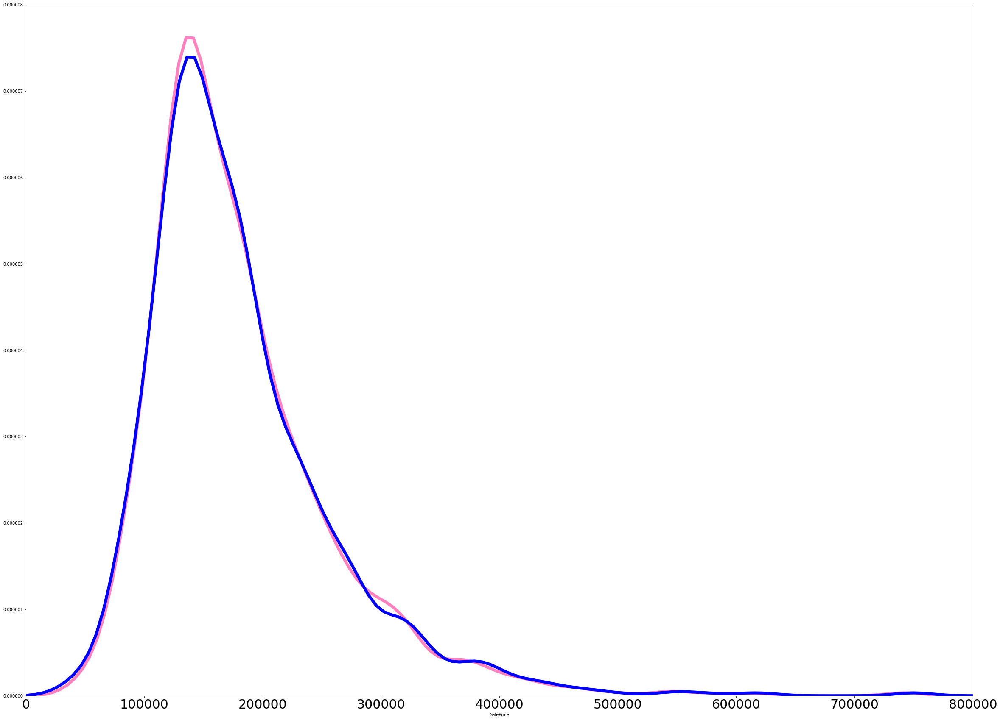

In [103]:
plt.figure(figsize=(40,30))
plt.xlim(left=0)
plt.xlim(right=800000)
plt.xticks(fontsize=30)
sns.distplot(xgb_pred,color="xkcd:pink",hist=False, kde_kws=dict( linewidth= 7))
plt.xlim(left=0)
plt.xlim(right=800000)
sns.distplot(y_train,color="blue",hist=False, kde_kws=dict( linewidth= 7))

In [126]:
# run the same predictions on test set and plot

ridge = RidgeCV()
ridge.fit(X_train,y_train)

X_test = X_test.reset_index(drop=True)

ridge_pred_test = ridge.predict(X_test)
ridge_pred_test = pd.DataFrame(ridge_pred_test)
X_test_comb = pd.concat([X_test,ridge_pred_test],axis=1)
X_test_comb.rename(columns={0:'Ridge_prediction'},inplace=True)
gb = GradientBoostingRegressor(alpha=0.95, learning_rate=0.1, loss="lad", max_depth=3, max_features=0.2, min_samples_leaf=19, min_samples_split=15, n_estimators=100, subsample=0.6500000000000001)
gb.fit(X_train_comb,y_train)
X_test_comb.columns.tolist()

gb_pred_test = gb.predict(X_test_comb)
gb_pred_test = pd.DataFrame(gb_pred_test)
X_test_comb2 = pd.concat([X_test_comb,gb_pred_test],axis=1)
X_test_comb2.rename(columns = {0:'GB generalizer'},inplace=True)

xgb = XGBRegressor(learning_rate=0.1, max_depth=5, min_child_weight=2, n_estimators=100, nthread=8, subsample=1.0)
xgb.fit(X_train_comb2,y_train)


xgb_pred_test = xgb.predict(X_test_comb2)
xgb_pred_test = pd.DataFrame(xgb_pred_test)
X_test_comb3 = pd.concat([X_test_comb2,xgb_pred_test],axis=1)
X_test_comb3.rename(columns = {0:'XGB generalizer'},inplace=True)
X_test_comb3.head(5)

df_test['SalePrice'] = y_pred
submissions = df_test[['Id','SalePrice']]
submissions['Id'] = submissions['Id'].astype(int)
submissions.to_csv('C:\\Users\\jjonus\\Google Drive\\Kaggle\\Advanced House Prices\\KBest.csv',encoding='utf-8',index=False)



,OverallQual,GarageCars,TotalBsmtSF,GrLivArea,GarageArea,FullBath,YearBuilt,GarageYrBlt,ExterQual_TA,1stFlrSF,...,LotShape_IR3,Condition1_PosN,BsmtFinType1_LwQ,BsmtFinType1_BLQ,MSZoning_RH,Neighborhood_NPkVill,FireplaceQu_Fa,Ridge_prediction,GB generalizer,XGB generalizer
0,5,1.0,882.0,896,730.0,1,1961,1961.0,1,896,...,0,0,0,0,1,0,0,106811.301051,126634.353332,123746.242188
1,6,1.0,1329.0,1329,312.0,1,1958,1958.0,1,1329,...,0,0,0,0,0,0,0,141355.114213,155757.815799,160400.078125
2,5,2.0,928.0,1629,482.0,2,1997,1997.0,1,928,...,0,0,0,0,0,0,0,181808.861371,187248.471216,197081.234375
3,6,2.0,926.0,1604,470.0,2,1998,1998.0,1,926,...,0,0,0,0,0,0,0,196139.310480,200319.867812,196413.265625
4,8,2.0,1280.0,1280,506.0,2,1992,1992.0,0,1280,...,0,0,0,0,0,0,0,209792.441278,203878.947975,200409.812500


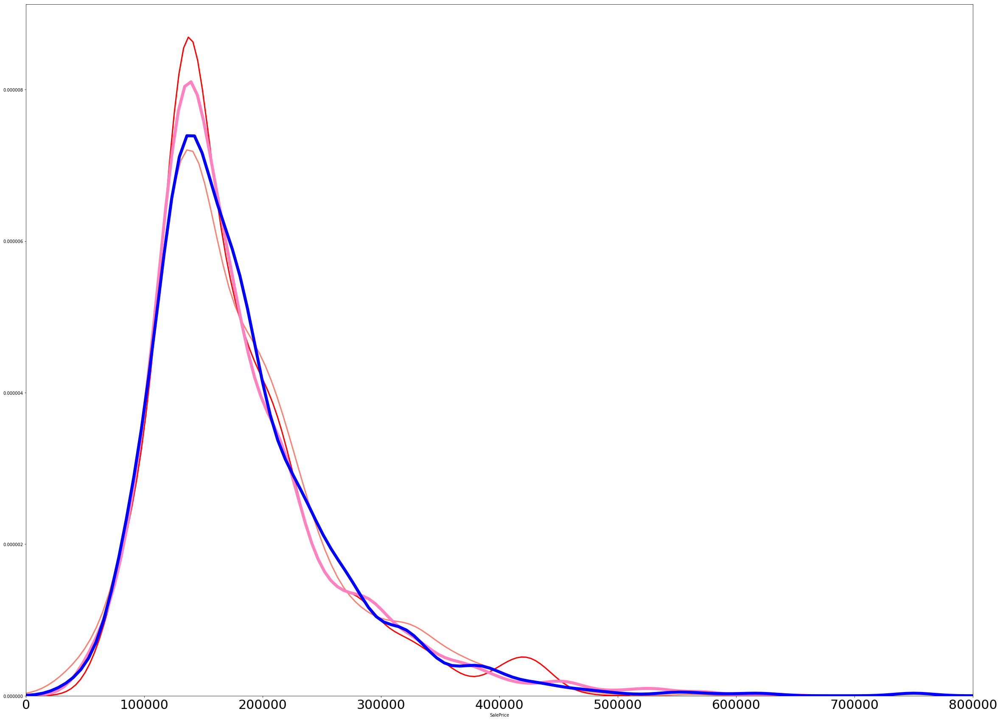

In [127]:
plt.figure(figsize=(40,30))
plt.xlim(left=0)
plt.xlim(right=800000)
plt.xticks(fontsize=30)
sns.distplot(ridge_pred_test,color="salmon",hist=False,  kde_kws=dict( linewidth= 3))
sns.distplot(gb_pred_test,color="red",hist=False, kde_kws=dict( linewidth= 3))
sns.distplot(xgb_pred_test,color="xkcd:pink",hist=False, kde_kws=dict( linewidth= 7))
plt.xlim(left=0)
plt.xlim(right=800000)
sns.distplot(y_train,color="blue",hist=False, kde_kws=dict( linewidth= 7))


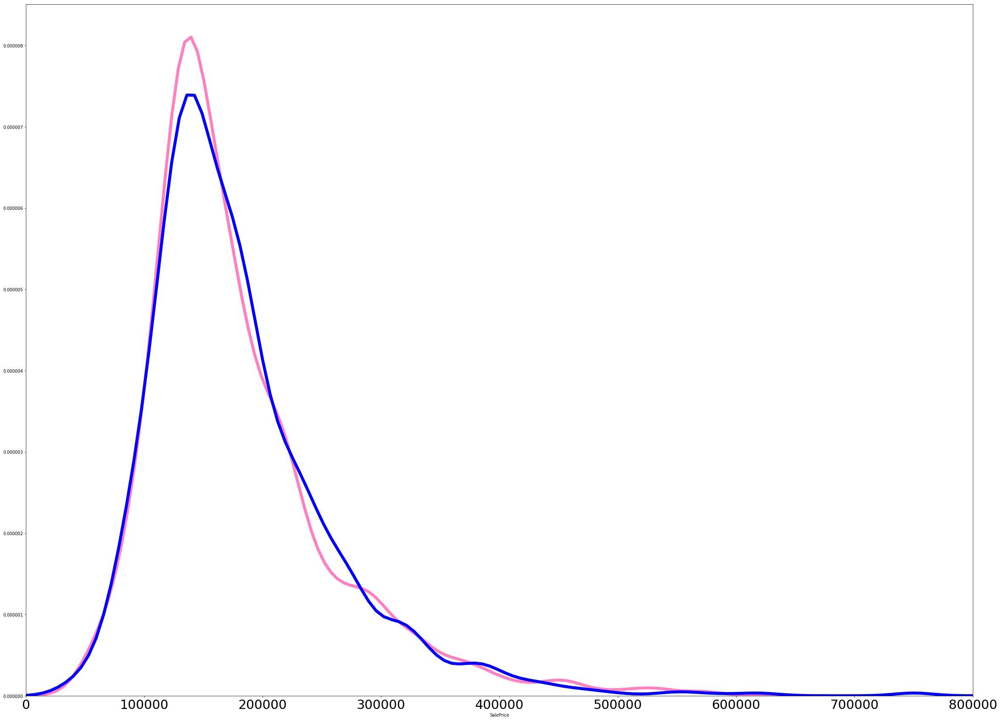

In [128]:
plt.figure(figsize=(40,30))
plt.xlim(left=0)
plt.xlim(right=800000)
plt.xticks(fontsize=30)
sns.distplot(xgb_pred_test,color="xkcd:pink",hist=False, kde_kws=dict( linewidth= 7))
plt.xlim(left=0)
plt.xlim(right=800000)
sns.distplot(y_train,color="blue",hist=False, kde_kws=dict( linewidth= 7))

----------------------
Pipeline(memory=None,
     steps=[('stackingestimator-1', StackingEstimator(estimator=LassoLarsCV(copy_X=True, cv='warn', eps=2.220446049250313e-16,
      fit_intercept=True, max_iter=500, max_n_alphas=1000, n_jobs=None,
      normalize=False, positive=False, precompute='auto', verbose=False))), ('stackingestimator-2', Stacki...ators=100, n_jobs=None,
          oob_score=False, random_state=None, verbose=0, warm_start=False))])
----------------------
cross_val: mean= 0.12376284426906618 , std= 0.02172587172744151
26 outliers:
[11, 13, 58, 224, 313, 349, 377, 440, 473, 496, 527, 581, 632, 688, 691, 774, 798, 803, 898, 1046, 1169, 1181, 1182, 1298, 1324, 1373]


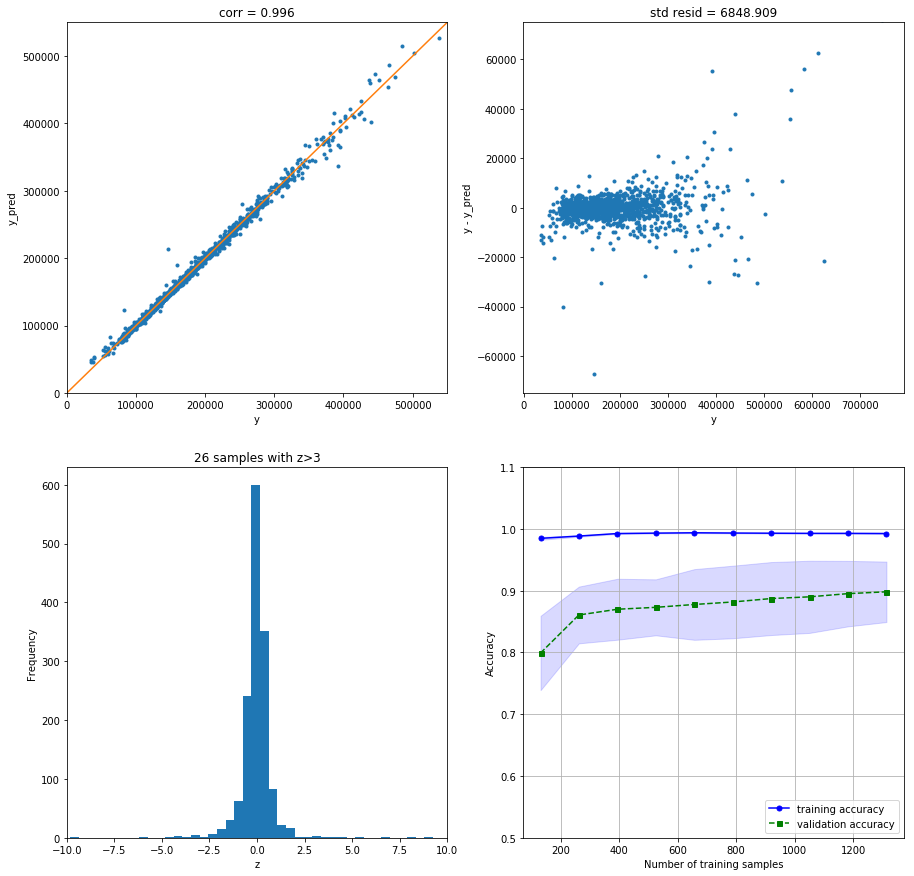

In [136]:
# best model with feature engineering

from sklearn.linear_model import LassoLarsCV
from sklearn.ensemble import ExtraTreesRegressor

exported_pipeline = make_pipeline(
    StackingEstimator(estimator=LassoLarsCV(normalize=False)),
    StackingEstimator(estimator=GradientBoostingRegressor(alpha=0.85, learning_rate=0.1, loss="huber", max_depth=10, max_features=0.15000000000000002, min_samples_leaf=20, min_samples_split=8, n_estimators=100, subsample=0.7000000000000001)),
    ExtraTreesRegressor(bootstrap=False, max_features=0.6000000000000001, min_samples_leaf=1, min_samples_split=10, n_estimators=100)
)


score_models,model = fit_train(exported_pipeline,X_train,y_train,'Best_eng_model',score_models)


----------------------
LassoLarsCV(copy_X=True, cv='warn', eps=2.220446049250313e-16,
      fit_intercept=True, max_iter=500, max_n_alphas=1000, n_jobs=None,
      normalize=False, positive=False, precompute='auto', verbose=False)
----------------------
cross_val: mean= 0.14798030113308186 , std= 0.02183868972221906
18 outliers:
[377, 440, 473, 523, 581, 588, 632, 688, 691, 774, 803, 898, 1046, 1169, 1181, 1182, 1298, 1324]


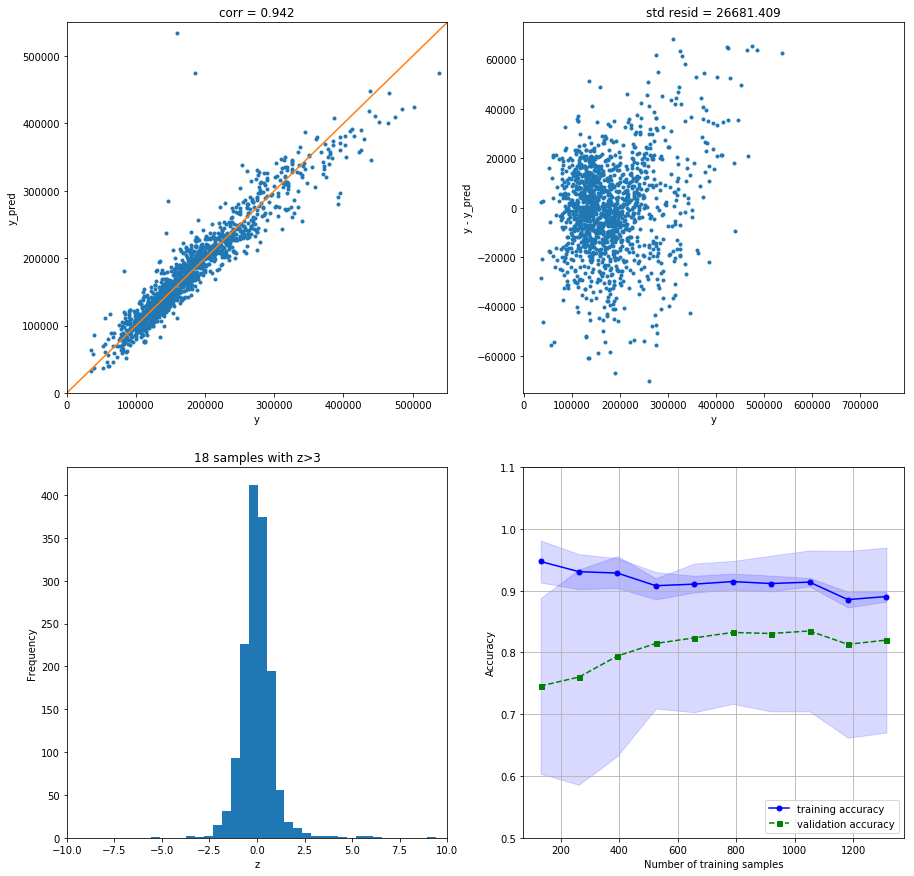

In [137]:
# first stacked layer - building the distribution


lasso = LassoLarsCV(normalize=False)

score_models,model = fit_train(lasso,X_train,y_train,'Lassolars',score_models)



In [141]:
shap_values_lasso1 = shap_explainer.shap_values(X_train)

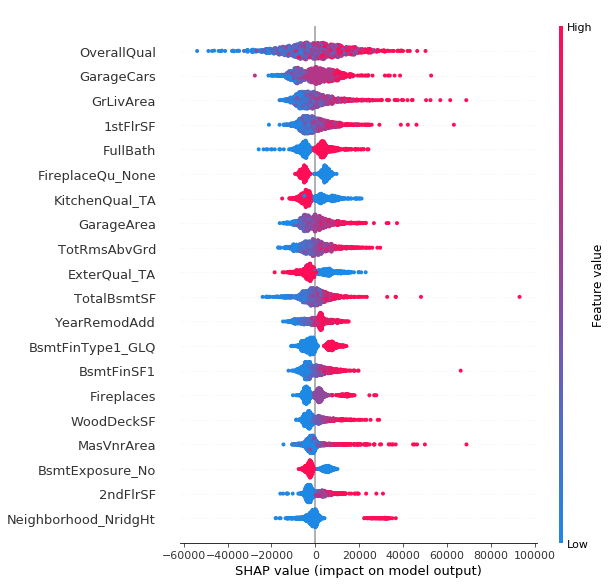

In [142]:
shap.summary_plot(shap_values_lasso1,X_train)

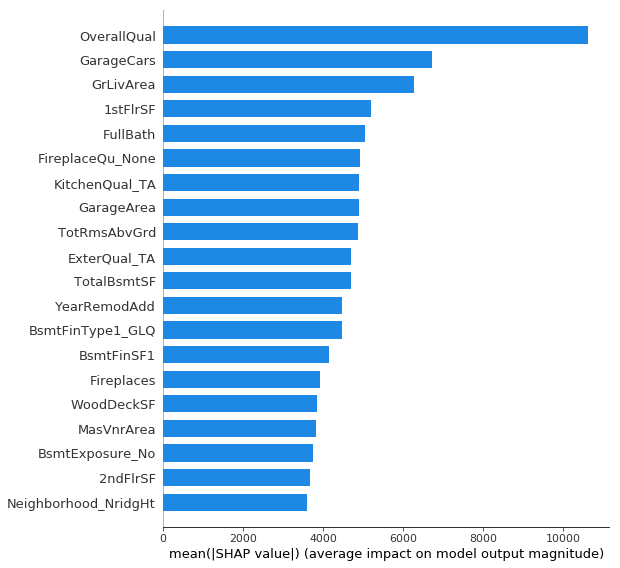

In [144]:
shap.summary_plot(shap_values_lasso1,X_train,plot_type="bar")

In [147]:
lasso_pred = model.predict(X_train)
lasso_pred = pd.DataFrame(lasso_pred)
X_train_eng_comb = pd.concat([X_train,lasso_pred],axis=1)
X_train_eng_comb.rename(columns={0:'lasso generalizer'},inplace=True)
X_train_eng_comb.head(5)


,OverallQual,GarageCars,TotalBsmtSF,GrLivArea,GarageArea,FullBath,YearBuilt,GarageYrBlt,ExterQual_TA,1stFlrSF,...,SaleType_ConLD,3SsnPorch,LotShape_IR3,Condition1_PosN,BsmtFinType1_LwQ,BsmtFinType1_BLQ,MSZoning_RH,Neighborhood_NPkVill,FireplaceQu_Fa,lasso generalizer
0,7,2.0,856.0,1710,548.0,2,2003,2003.0,0,856,...,0,0,0,0,0,0,0,0,0,205243.793692
1,6,2.0,1262.0,1262,460.0,2,1976,1976.0,1,1262,...,0,0,0,0,0,0,0,0,0,191925.154114
2,7,2.0,920.0,1786,608.0,2,2001,2001.0,0,920,...,0,0,0,0,0,0,0,0,0,209420.195923
3,7,3.0,756.0,1717,642.0,1,1915,1998.0,1,961,...,0,0,0,0,0,0,0,0,0,177476.300501
4,8,3.0,1145.0,2198,836.0,2,2000,2000.0,0,1145,...,0,0,0,0,0,0,0,0,0,303739.537645


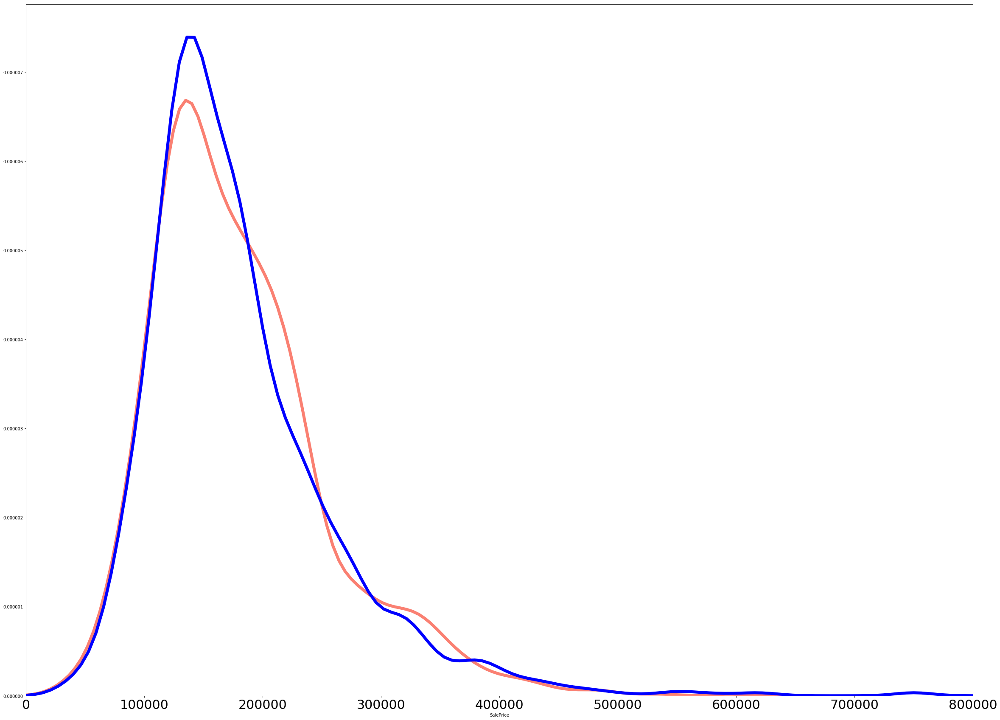

In [148]:
plt.figure(figsize=(40,30))
plt.xlim(left=0)
plt.xlim(right=800000)
plt.xticks(fontsize=30)
sns.distplot(lasso_pred,color="salmon",hist=False, kde_kws=dict( linewidth= 7))
plt.xlim(left=0)
plt.xlim(right=800000)
sns.distplot(y_train,color="blue",hist=False, kde_kws=dict( linewidth= 7))

----------------------
GradientBoostingRegressor(alpha=0.85, criterion='friedman_mse', init=None,
             learning_rate=0.1, loss='huber', max_depth=10,
             max_features=0.15000000000000002, max_leaf_nodes=None,
             min_impurity_decrease=0.0, min_impurity_split=None,
             min_samples_leaf=20, min_samples_split=8,
             min_weight_fraction_leaf=0.0, n_estimators=100,
             n_iter_no_change=None, presort='auto', random_state=None,
             subsample=0.7000000000000001, tol=0.0001,
             validation_fraction=0.1, verbose=0, warm_start=False)
----------------------
cross_val: mean= 0.12373654575527052 , std= 0.016191088435543535
19 outliers:
[185, 313, 440, 523, 581, 608, 632, 688, 691, 769, 774, 803, 898, 1046, 1169, 1181, 1182, 1298, 1324]


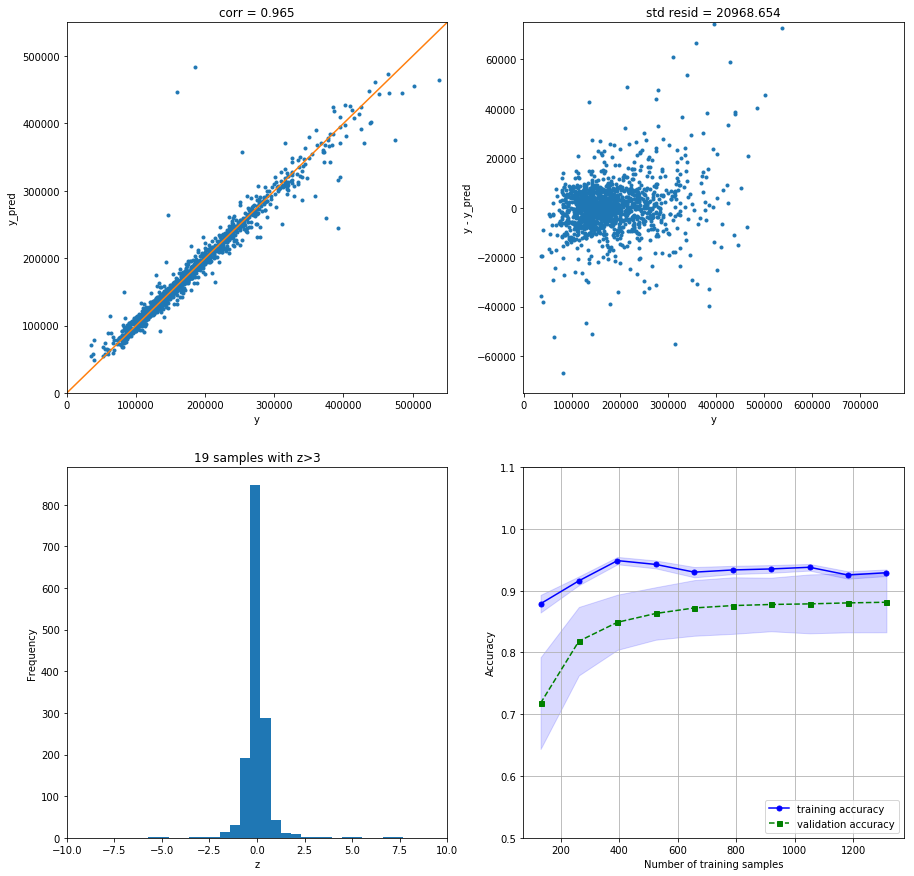

In [149]:
gb =GradientBoostingRegressor(alpha=0.85, learning_rate=0.1, loss="huber",
                              max_depth=10, max_features=0.15000000000000002, min_samples_leaf=20, min_samples_split=8,
                              n_estimators=100, subsample=0.7000000000000001)

score_models,model = fit_train(gb,X_train_eng_comb,y_train,'Lassolars',score_models)


In [ ]:
# explain the gb + ridge model
def gb_predict(data_asarray):
    data_asframe =  pd.DataFrame(data_asarray, columns=X_train_eng_comb.columns.tolist())
    return model.predict(data_asframe)

shap_kernel_explainer = shap.KernelExplainer(gb_predict, X_train_eng_comb)
shap_values = shap_kernel_explainer.shap_values(X_train_eng_comb,nsamples=1000)

Using 1460 background data samples could cause slower run times. Consider using shap.kmeans(data, K) to summarize the background as K weighted samples.

  7%|██▌                                   | 99/1460 [30:45<6:53:45, 18.24s/it]


 14%|████▊                              | 201/1460 [1:01:26<6:16:16, 17.93s/it]


 21%|███████▎                           | 303/1460 [1:32:11<5:49:39, 18.13s/it]


 21%|███████▎                           | 307/1460 [1:33:25<5:53:23, 18.39s/it]